# **Requisits d'execució**

In [ ]:
!git clone https://github.com/OscarMoliina/betterlifebetterhealth.git

In [ ]:
!pip3 install pyspark
!pip3 install duckdb
import pyspark

from pyspark.sql import SparkSession, DataFrame
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.clustering import KMeans
from pyspark.ml import Pipeline
from pyspark.sql.functions import col, mean, when, count, regexp_replace
from pyspark.sql.window import Window


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# **Preprocessament superficial de la base de dades**

### *Lectura de les bases de dades*

In [ ]:
spark = SparkSession.builder \
    .appName("Preprocessing") \
    .config("spark.jars", "/content/betterlifebetterhealth/src/duckdb.jar") \
    .getOrCreate()

dem = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/betterlifebetterhealth/src/demography_df.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "demography_df") \
    .load()

mh = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/betterlifebetterhealth/src/mh_df.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "mh_df") \
    .load()

soc = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/betterlifebetterhealth/src/society_df.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "society_df") \
    .load()

### *Homogenització dels noms de les columnes*

    Adaptem el nom de les columnes de la base de dades demogràfiques amb l'objectiu d'homogenitzar l'estil.

In [ ]:
nous = {
    "NAME": "Country",
    "YR": "Year",
    "AREA_KM2": "Area_Km2",
    "DEATHS": "Deaths",
    "MEDAGE": "Medage",
    "POP_DENS": "Pop_Dens",
    "genc standard countries and areas": "GSCA",
    "code": "Code"
}

for columna_original, nom_nou in nous.items():
    dem = dem.withColumnRenamed(columna_original, nom_nou)

mh = mh.withColumnRenamed("Entity", "Country")


### *Filtratge de les Bases de Dades*


    Seleccionem els anys presents en les tres bases de dades, seran els que determinaran els fragments de bases de dades amb els quals treballarem.

In [ ]:
anys_soc = soc.select('Year').distinct()
anys_mh = mh.select('Year').distinct()
anys_dem = dem.select('Year').distinct()

intersecció = anys_soc.intersect(anys_mh).intersect(anys_dem).orderBy('Year')
anys_coincidents = [row['Year'] for row in intersecció.collect()]
print(anys_coincidents)

['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016']


    Ara ja tenim els anys en els quals ens volem centrar, a continuació filtarem les files de les bases de dades segons els anys.


In [ ]:
dem = dem.filter(dem['Year'].isin(anys_coincidents))
soc = soc.filter(soc['Year'].isin(anys_coincidents))
mh = mh.filter(mh['Year'].isin(anys_coincidents))

    També cal filtrar per països, ja que no totes les bases de dades tenen la mateixa informació.

### *Eliminació de columnes*

In [ ]:
# Eliminar la columna 'Code'
dem = dem.drop('Code')
mh = mh.drop('index','Code')

### *Distribució de variables i outliers*

**Dataset demografia:**

1. YR: Año de los datos, en este caso se recoge información de cada cinco años desde 1990 hasta 2019.

*VALOR ESPERADO (1990 hasta 2019.)*

2. AREA_KM2: Superficie del país en kilómetros cuadrados.

*VALOR ESPERADO (0 - 17 M)*

3. CBR (Crude Birth Rate): Tasa bruta de natalidad, es decir, el número de nacimientos por cada 1,000 personas por año.

*VALOR ESPERADO (10 - 40)*

4. CDR (Crude Death Rate): Tasa bruta de mortalidad, es decir, el número de muertes por cada 1,000 personas por año.

*VALOR ESPERADO (5 - 20)*


5. DEATHS: Número total de muertes registradas en el año indicado.

*VALOR ESPERADO (10.000 - 1M)*

6. E0 (Life Expectancy at Birth): Esperanza de vida al nacer, medida en años.

*VALOR ESPERADO (50 - 90)*

7. GRR (Gross Reproduction Rate): Tasa bruta de reproducción, que estima el número de hijas que una mujer tendría al final de su etapa reproductiva si estuviera sujeta a las tasas de fertilidad del período pero sin considerar la mortalidad.

*VALOR ESPERADO (0.5 - 2)*

8. IMR (Infant Mortality Rate): Tasa de mortalidad infantil, número de muertes de niños menores de un año por cada 1,000 nacimientos vivos en un año.

*VALOR ESPERADO (5 - 70)*

9. MEDAGE (Median Age): Edad mediana de la población, que divide a la población en dos partes iguales: una más joven y otra más vieja.

*VALOR ESPERADO (20 - 50)*

10. MR0_4 (Mortality Rate for Under 5): Tasa de mortalidad de niños menores de cinco años por cada 1,000 niños en ese grupo de edad.

*VALOR ESPERADO (5 - 50)*

11. POP_DENS (Population Density): Densidad de población, calculada como el número de personas por kilómetro cuadrado.

*VALOR ESPERADO (1 - 1500)*


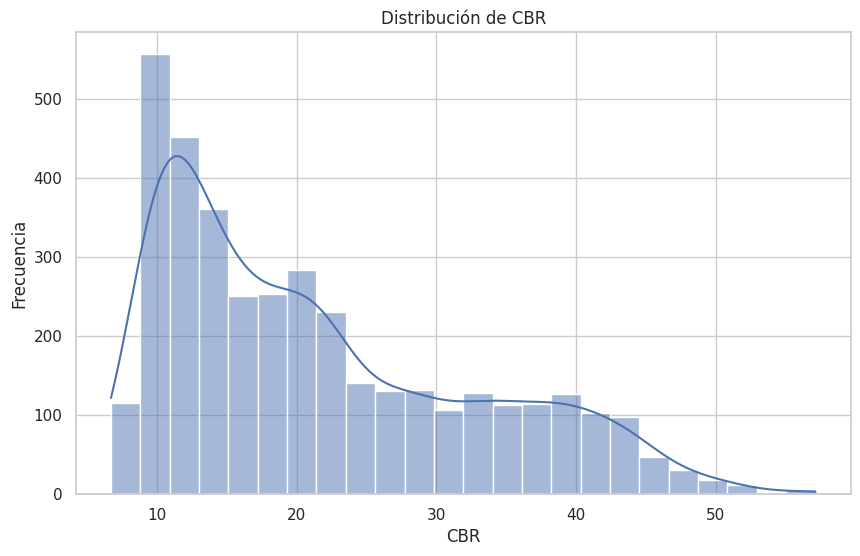

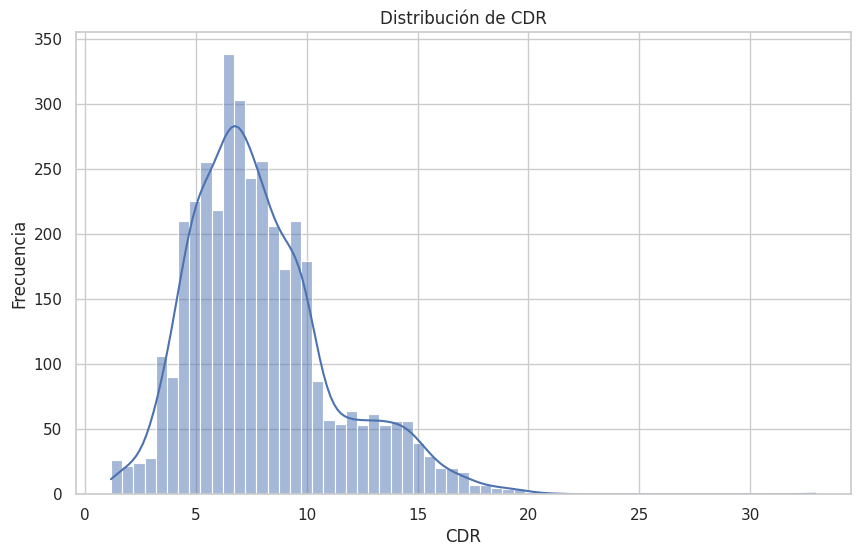

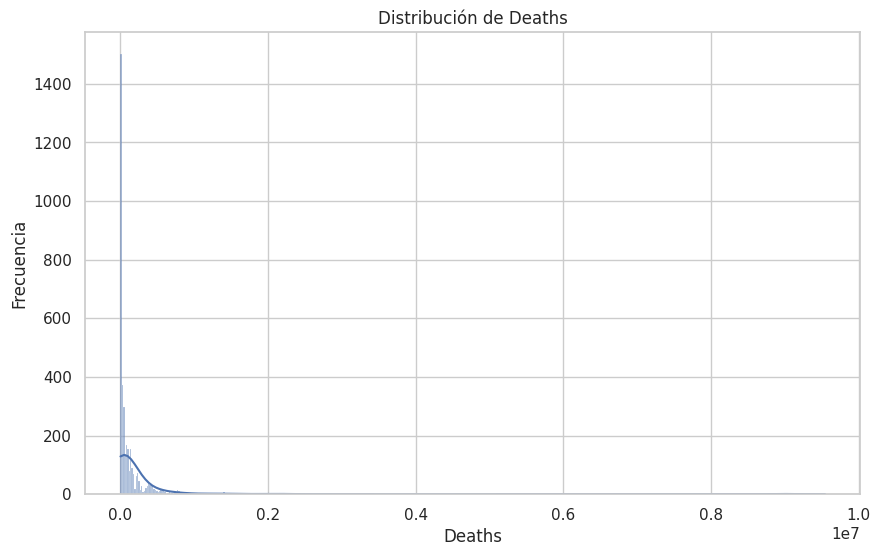

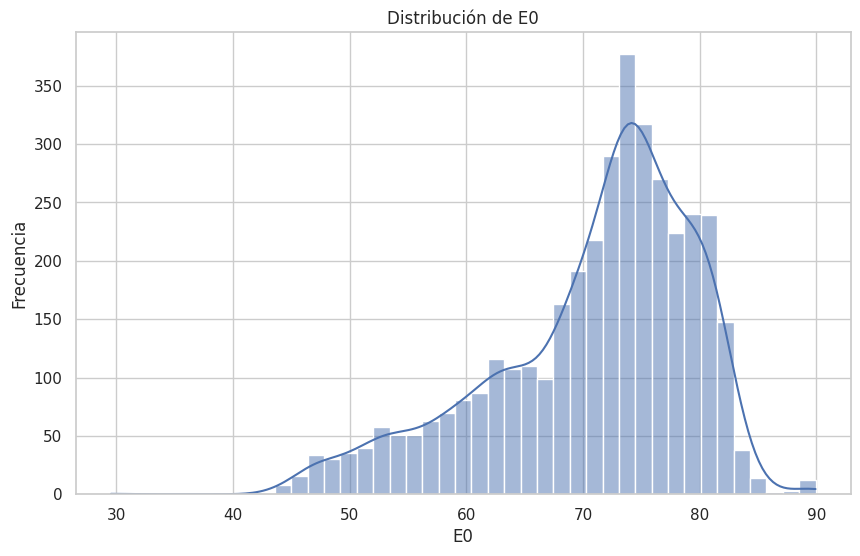

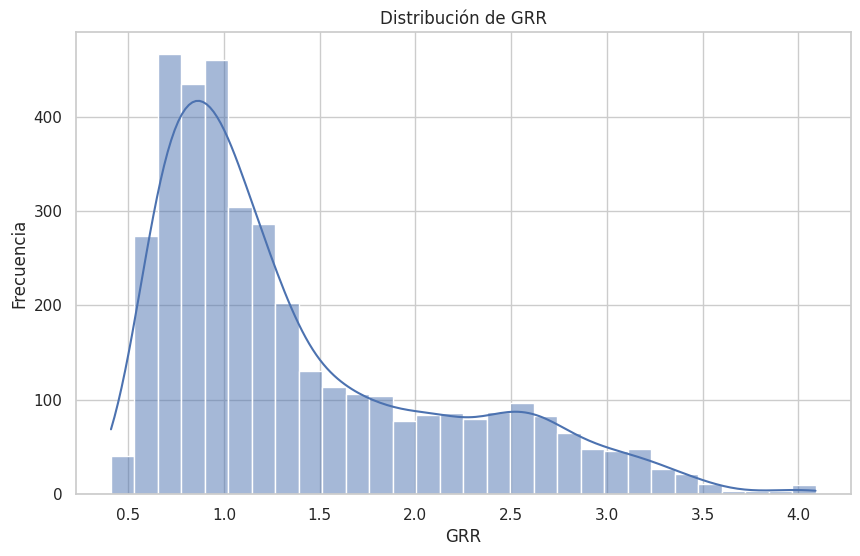

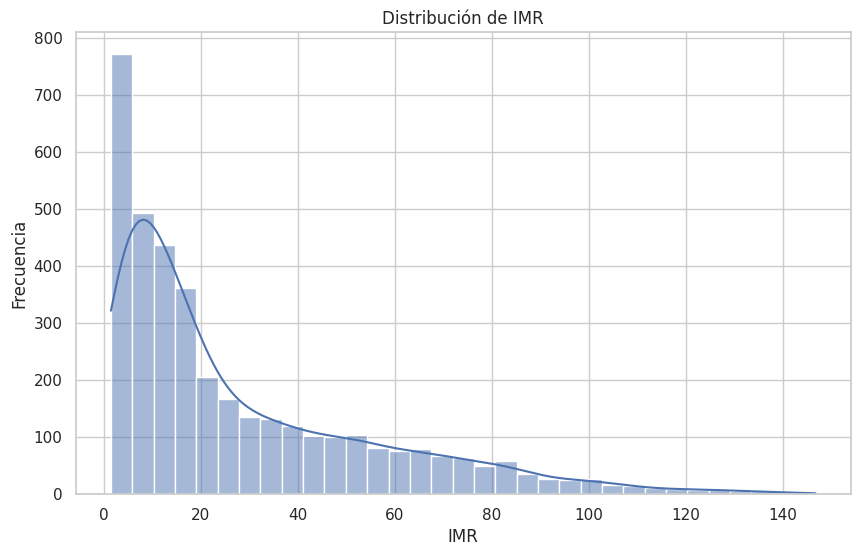

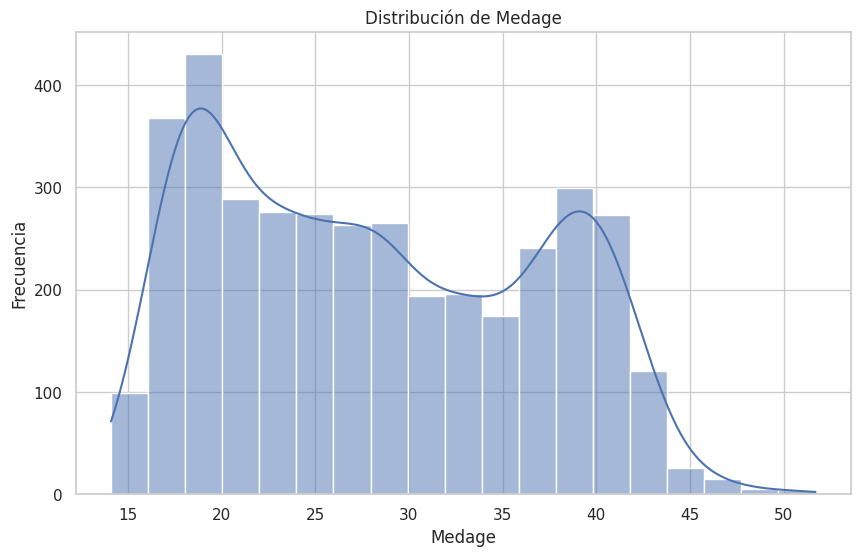

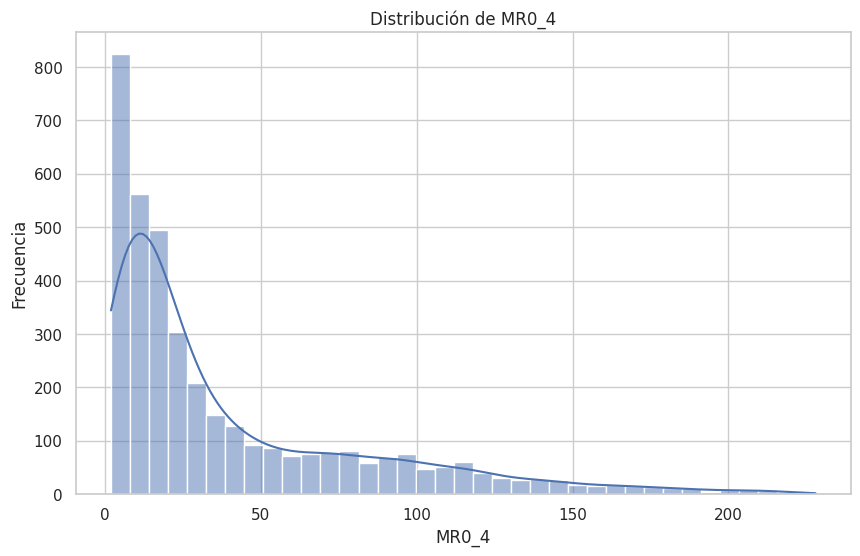

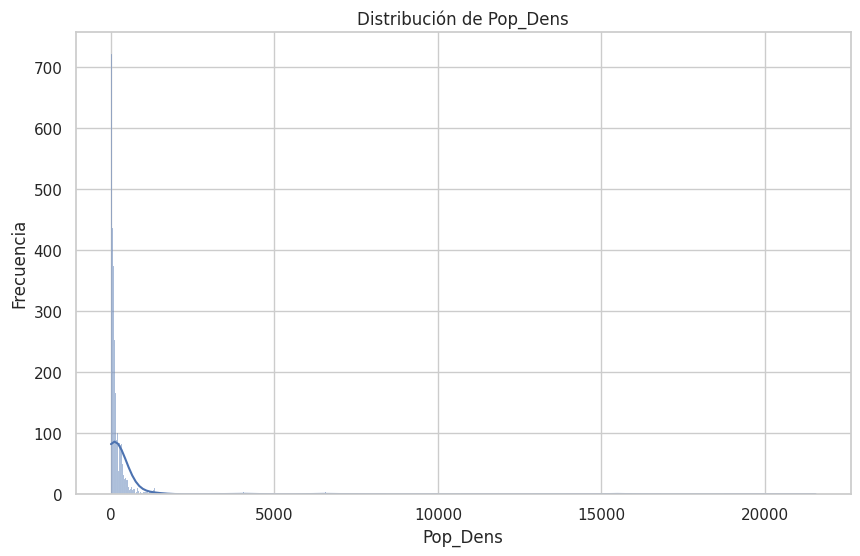

In [ ]:
# Convertir Spark DataFrame a Pandas DataFrame
dem_pd = dem.toPandas()

# Configurar el estilo visual de los gráficos de Seaborn
sns.set(style="whitegrid")

# Obtener información sobre los tipos de datos de cada columna
column_dtypes = dem.dtypes

# Seleccionar solo las columnas numéricas
numeric_columns = [column[0] for column in column_dtypes if column[1] in ['int', 'bigint', 'float', 'double']]

# Iterar a través de cada columna en el DataFrame
for column in numeric_columns:
    # Determinar si la variable es numérica o categórica
    if dem_pd[column].dtype in ['int64', 'float64']:  # Si la variable es numérica
        plt.figure(figsize=(10, 6))
        sns.histplot(dem_pd[column], kde=True)  # Histograma con estimación de densidad
        plt.title(f'Distribución de {column}')
        plt.xlabel(column)
        plt.ylabel('Frecuencia')
    else:  # Si la variable es categórica
        plt.figure(figsize=(10, 6))
        sns.countplot(y=column, data=dem_pd)  # Gráfico de conteo para variables categóricas
        plt.title(f'Distribución de {column}')
        plt.xlabel('Conteo')
        plt.ylabel(column)
    plt.show()


No s'eliminen els outliers perquè, malgrat que hi ha valors que apareixen fora de l'interval en els gràfics, aquests s'ajusten als valors esperats pel coneixement expert. Els outliers poden ser resultats d'anomalies estadístiques o comportaments rars, però en molts casos, poden ser explicats per factors específics del domini o del context. És important considerar aquests valors anòmals com a part de la varietat natural de les dades i interpretar-los dins del context de l'anàlisi.

**Dataset mental health:**


In [ ]:
mh_pd = mh.toPandas()

In [ ]:
# IDENTIFICAR COLUMNES AMB MISSING DATA:
total_rows = mh.count()

na_columns = []
for column in mh.columns:
    non_na_count = mh.agg(count(col(column)).alias('non_na_count')).collect()[0]['non_na_count']
    if non_na_count < total_rows:
        na_columns.append(column)

print("Columnas con valores NA:", na_columns)

Columnas con valores NA: ['Schizophrenia (%)', 'Bipolar disorder (%)', 'Eating disorders (%)', 'Anxiety disorders (%)', 'Drug use disorders (%)', 'Depression (%)', 'Alcohol use disorders (%)']


In [ ]:
percentage_columns = [
    'Schizophrenia (%)', 'Bipolar disorder (%)', 'Eating disorders (%)',
    'Anxiety disorders (%)', 'Drug use disorders (%)', 'Depression (%)',
    'Alcohol use disorders (%)'
]

for column in percentage_columns:
    mh = mh.withColumn(column, regexp_replace(col(column), "%", "").cast("double"))

mh.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Schizophrenia (%): double (nullable = true)
 |-- Bipolar disorder (%): double (nullable = true)
 |-- Eating disorders (%): double (nullable = true)
 |-- Anxiety disorders (%): double (nullable = true)
 |-- Drug use disorders (%): double (nullable = true)
 |-- Depression (%): double (nullable = true)
 |-- Alcohol use disorders (%): double (nullable = true)



In [ ]:
# # Convertir Spark DataFrame a Pandas DataFrame
# mh_pd = mh.toPandas()

# import seaborn as sns
# import matplotlib.pyplot as plt

# # Configurar el estilo visual de los gráficos de Seaborn
# sns.set(style="whitegrid")

# # Obtener información sobre los tipos de datos de cada columna
# column_dtypes = mh.dtypes

# # Seleccionar solo las columnas numéricas
# numeric_columns = [column[0] for column in column_dtypes if column[1] in ['int', 'bigint', 'float', 'double']]
# print(numeric_columns)

# # Iterar a través de cada columna en el DataFrame
# for column in numeric_columns:
#     # Determinar si la variable es numérica o categórica
#     if mh_pd[column].dtype in ['int64', 'float64']:  # Si la variable es numérica
#         plt.figure(figsize=(10, 6))
#         sns.histplot(mh_pd[column], kde=True)  # Histograma con estimación de densidad
#         plt.title(f'Distribución de {column}')
#         plt.xlabel(column)
#         plt.ylabel('Frecuencia')
#     else:  # Si la variable es categórica
#         plt.figure(figsize=(10, 6))
#         sns.countplot(y=column, data=mh_pd)  # Gráfico de conteo para variables categóricas
#         plt.title(f'Distribución de {column}')
#         plt.xlabel('Conteo')
#         plt.ylabel(column)
#     plt.show()

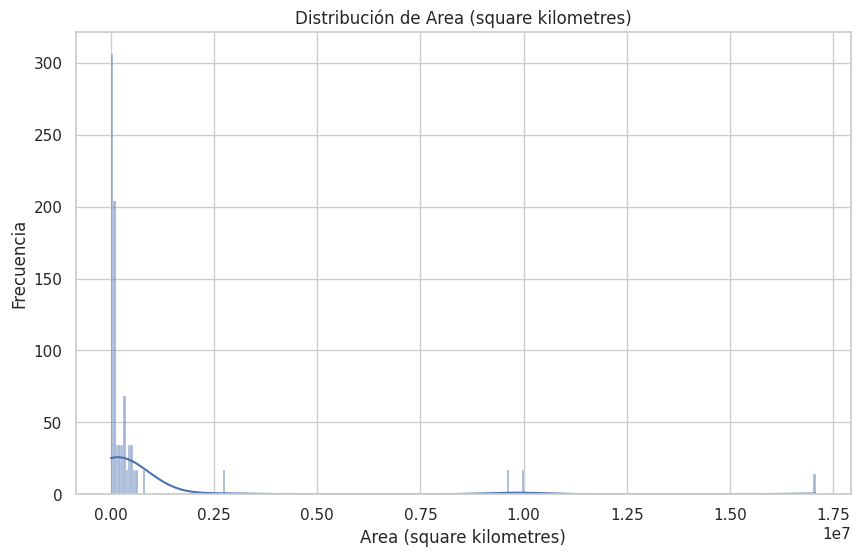

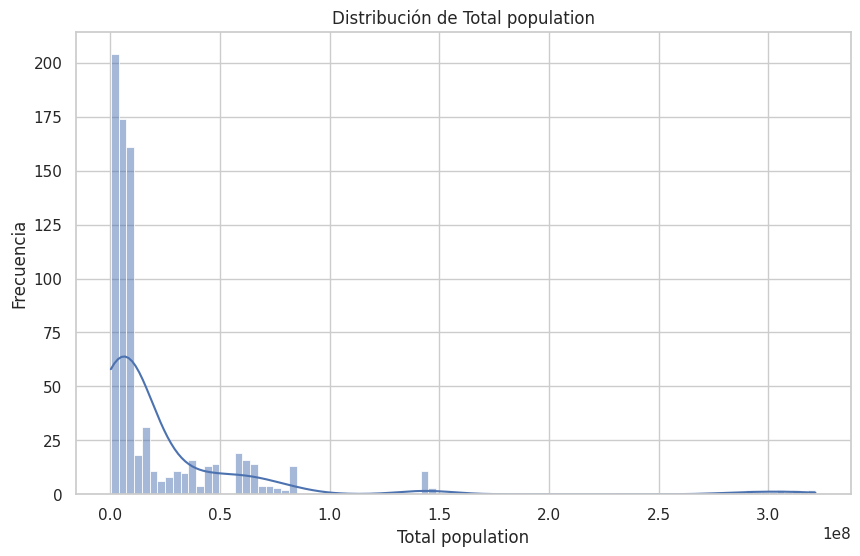

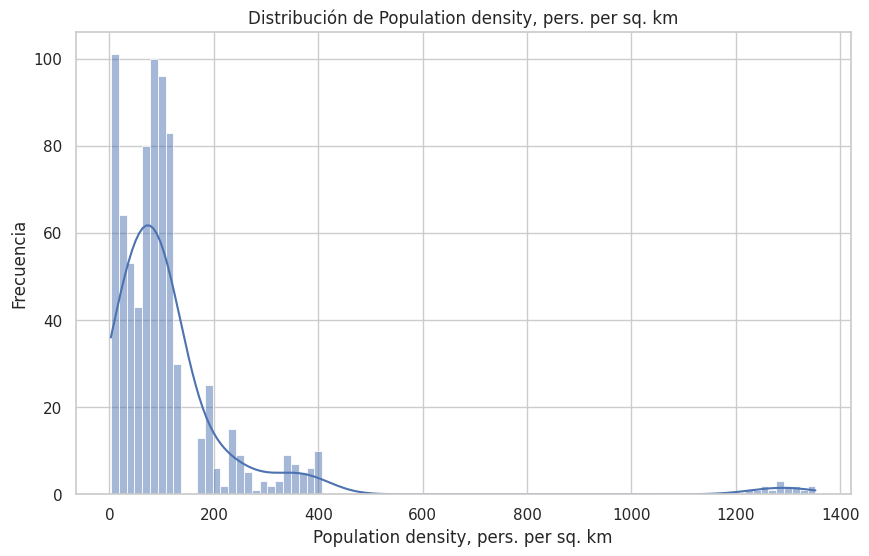

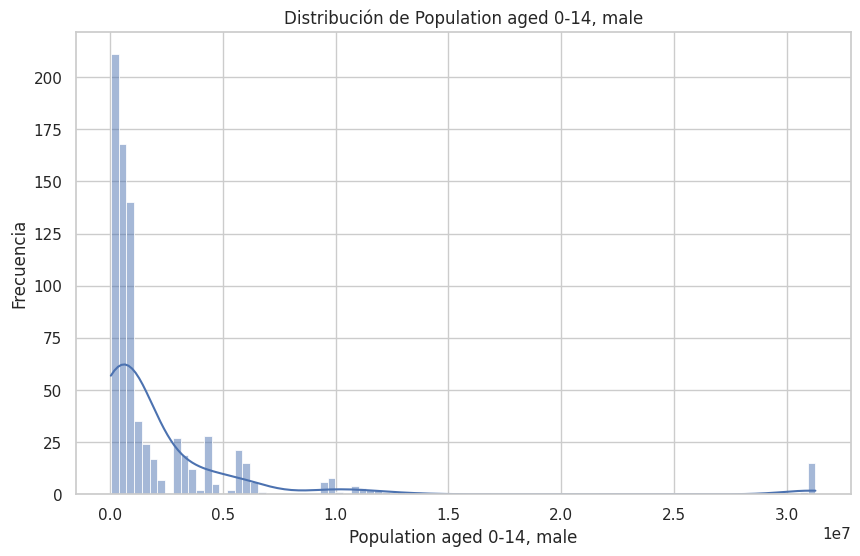

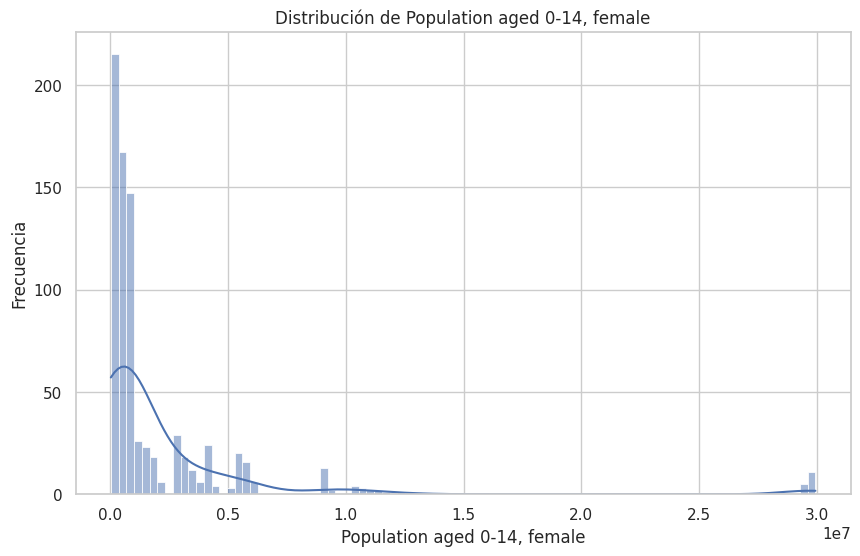

...

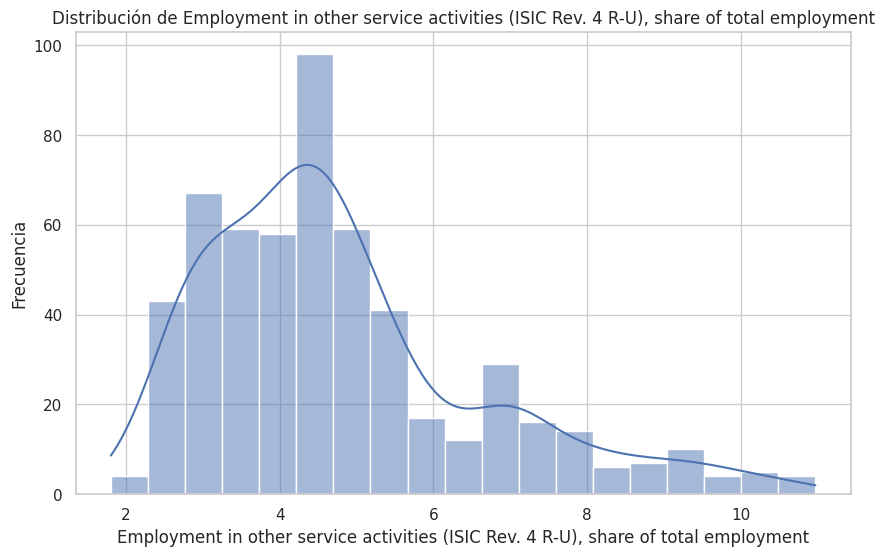

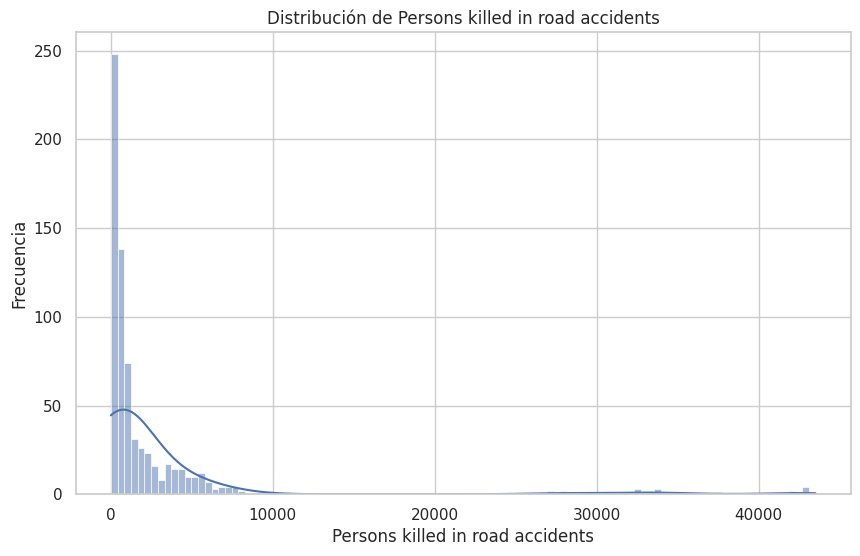

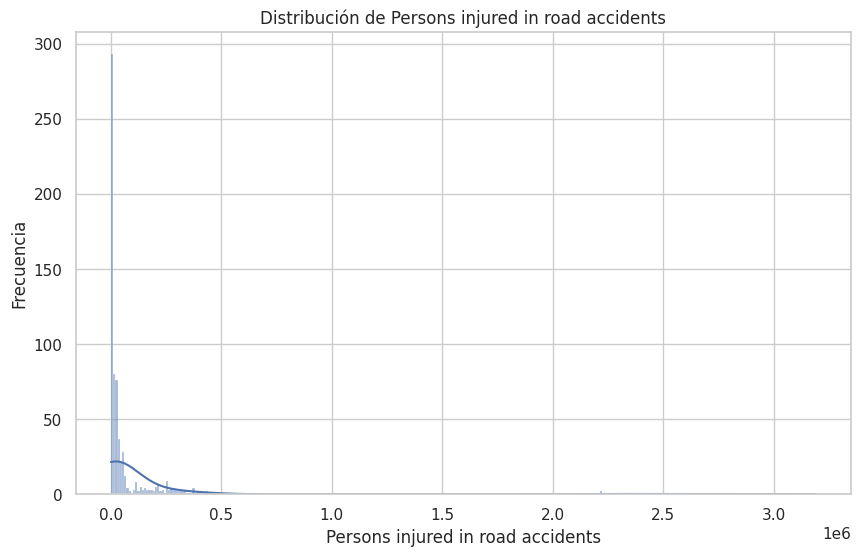

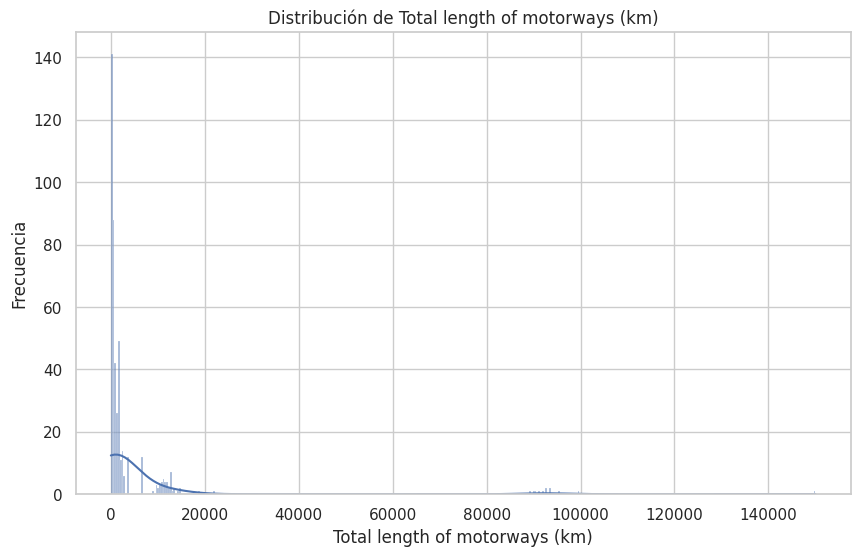

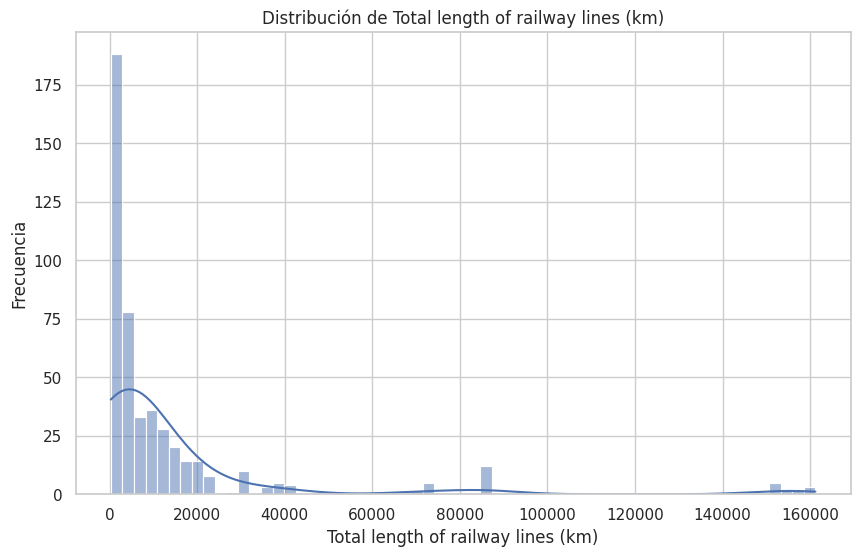

In [ ]:
# Convertir Spark DataFrame a Pandas DataFrame
soc_pd = soc.toPandas()

# Configurar el estilo visual de los gráficos de Seaborn
sns.set(style="whitegrid")

# Obtener información sobre los tipos de datos de cada columna
column_dtypes = soc.dtypes

# Seleccionar solo las columnas numéricas
numeric_columns = [column[0] for column in column_dtypes if column[1] in ['int', 'bigint', 'float', 'double']]

# Iterar a través de cada columna en el DataFrame
for column in numeric_columns:
    # Determinar si la variable es numérica o categórica
    if soc_pd[column].dtype in ['int64', 'float64']:  # Si la variable es numérica
        plt.figure(figsize=(10, 6))
        sns.histplot(soc_pd[column], kde=True)  # Histograma con estimación de densidad
        plt.title(f'Distribución de {column}')
        plt.xlabel(column)
        plt.ylabel('Frecuencia')
    else:  # Si la variable es categórica
        plt.figure(figsize=(10, 6))
        sns.countplot(y=column, data=soc_pd)  # Gráfico de conteo para variables categóricas
        plt.title(f'Distribución de {column}')
        plt.xlabel('Conteo')
        plt.ylabel(column)
    plt.show()

Només es retalla en la variable Purchasing Power Parity (PPP), NCU per US$, eliminant els valors extrems que, tot i tenir poca freqüència en els gràfics, distorsionen l'anàlisi.

### **Estudi de les bases de dades**

    Aquesta secció té com a objectiu estudiar les bases de dades, juntament amb les seves corresponents correlacions i covariançes. L'objectiu d'aquesta anàlisi és determinar si hi ha alguna columna redundant, explorar la possibilitat de combinar columnes o eliminar-ne alguna que no sigui rellevant per als nostres objectius

In [ ]:
df_soc = pd.read_csv("/content/betterlifebetterhealth/data/society.csv")
df_mh = pd.read_csv("/content/betterlifebetterhealth/data/mental_health.csv")
df_dem = pd.read_csv("/content/betterlifebetterhealth/data/demography.csv")

<ipython-input-121-2740196c8521>:2: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_mh = pd.read_csv("/content/betterlifebetterhealth/data/mental_health.csv")


#### **Estudi de la base de dades relativa a la societat**

In [ ]:
df_soc.describe()
df_soc.describe().to_csv('descripció_soc.csv', index=True)

Les tasques a fer en aquesta secció són les següents:

*   Unir les columnes referents a la població separades per gènere.
*   Fer la mitjana per l'esperança de vida d'homes i dones, general i en nèixer
* Eliminar les columnes:
  *   Total fertility rate
  *   Adolescent fertility rate
  * Female part-time employment, percent of both sexes
  * Gender pay gap in hourly earning wage rate
  * GDP at current prices, millions of NCUs
  * GDP per capita at current prices and PPPs, US
  * GDP per capita at current prices, NCUs
  * Persons injured in road accidents
  * Persons killed in road accidents
  * Exchange rate (XR), NCU per US$


* Unir les columnes referents a l'ús de l'ordinador per edats separades per gènere (o eliminar, hi ha molt NULL, a veure què ha fet el Joan)

* Columnes que unirem segons un índex de avenç segons el gènere:
  * Women Researchers, Percent of corresponding total for both sexes
  * Female legislators, senior officials and managers, percent of total
  * Female professionals, percent of total for both sexes
  * Female clerks, percent of total for both sexes
  * Female craft and related workers, percent of total for both sexes
  * Female plant and machine operators and assemblers, percent of total for both sexes
  * Female government ministers, percent of total
  * Female members of parliament, percent of total
  * Female ambassadors, percent of total
  * Female judges, percent of total

* Unir les columnes relatives a l'activitat econòmica entre els 15 i els 64 anys separades per gènere (molts NULL també, esperar al Joan)










In [ ]:
columnes_a_eliminar = [
    'Total fertility rate',
    'Adolescent fertility rate',
    'Female part-time employment, percent of both sexes',
    'Gender pay gap in hourly earning wage rate',
    'GDP at current prices, millions of NCUs',
    'GDP per capita at current prices and PPPs, US',
    'GDP per capita at current prices, NCUs',
    'Persons injured in road accidents',
    'Persons killed in road accidents',
    'Exchange rate (XR), NCU per US$'
]

# Eliminar les columnes
soc = soc.drop(*columnes_a_eliminar)

In [ ]:
# Unir les columnes referents a la població separades per gènere.
columnes_a_unir = [
    ('Population aged 0-14, male','Population aged 0-14, female'),
    ('Population aged 15-64, male','Population aged 15-64, female'),
    ('Population aged 64+, male','Population aged 64+, female')
]

for i,j in columnes_a_unir:
  # Definir el nou nom de la columna resultant
  nou_nom_columna = i.split(",")[0]
  # Crear la nova columna amb la suma de les dues columnes
  soc = soc.withColumn(nou_nom_columna, col(i) + col(j))

  # Eliminar les columnes originals
  soc= soc.drop(i, j)

In [ ]:
# Fer la mitjana per l'esperança de vida d'homes i dones, general i en nèixer
columnes_a_unir = [
    ('Life expectancy at birth, women','Life expectancy at birth, men'),
    ('Life expectancy at age 65, women','Life expectancy at age 65, men'),
]

for i,j in columnes_a_unir:
  # Definir el nou nom de la columna resultant
  nou_nom_columna = i.split(",")[0]
  # Crear la nova columna amb la mitjana de les dues columnes
  soc = soc.withColumn(nou_nom_columna, (col(i) + col(j)) / 2)

  # Eliminar les columnes originals
  soc= soc.drop(i, j)

In [ ]:
# Fer la mitjana per l'esperança de vida d'homes i dones, general i en nèixer
columnes_a_unir = [
    ('Economic acivity rate, women 15-64','Economic activity rate, men 15-64'),
]

for i,j in columnes_a_unir:
  # Definir el nou nom de la columna resultant
  nou_nom_columna = j.split(",")[0]
  # Crear la nova columna amb la mitjana de les dues columnes
  soc = soc.withColumn(nou_nom_columna, (col(i) + col(j)) / 2)

  # Eliminar les columnes originals
  soc= soc.drop(i, j)


    Observem les correlacions amb l'objectiu de saber si hi ha alguna variable més que puguem eliminar

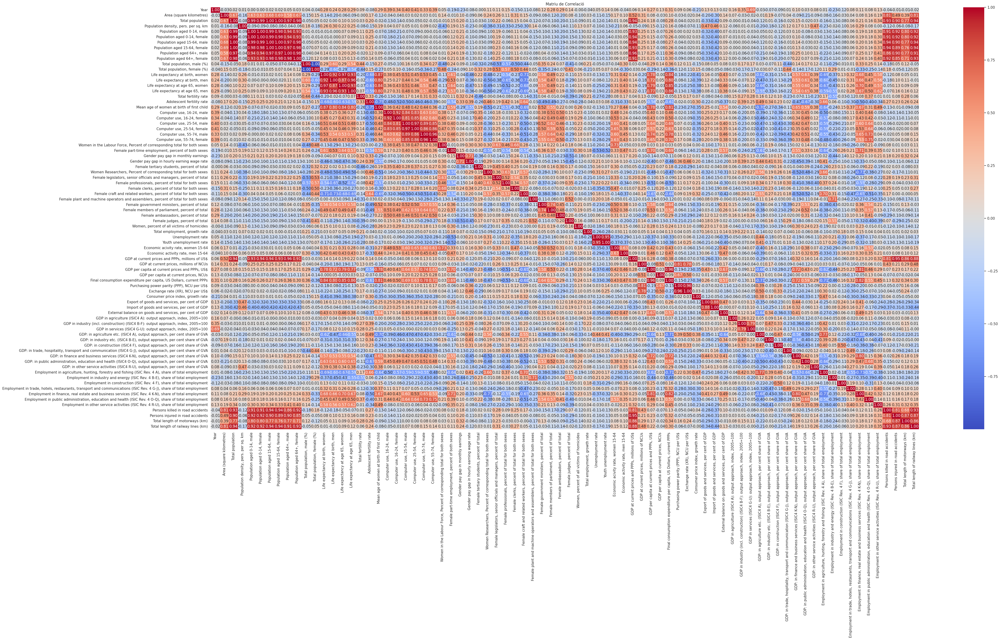

In [ ]:
df_num = df_soc.select_dtypes(include=['float64', 'int64'])
matr_corr = df_num.corr()
plt.figure(figsize=(50, 24))
sns.heatmap(matr_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriu de Correlació')
plt.show()

    Amb l'objectiu d'anarlitzar variable a variable aquelles correlacions que considerem altes, prendrem el *threshold* de 0.75 com a valor mínim per a considerar una correlació significant.

    Per cada parella present en aquest grup, analitzarem si es pot eliminar alguna de les dues variables.
    

In [ ]:
df_num = df_soc.select_dtypes(include=['float64', 'int64'])
matr_corr = df_num.corr()

# Obtenim les parelles correlacionades
high_corr_pairs = (matr_corr.abs() > 0.85) & (matr_corr.abs() < 1)
high_corr_pairs = high_corr_pairs.unstack().reset_index()
high_corr_pairs = high_corr_pairs[high_corr_pairs[0]]
high_corr_pairs = high_corr_pairs[high_corr_pairs.level_0 < high_corr_pairs.level_1]

# Eliminem les parelles repetides
printed_pairs = set()

# Creem el dataset
data = []
for idx, row in high_corr_pairs.iterrows():
    var1 = row['level_0']
    var2 = row['level_1']
    corr = matr_corr.loc[var1, var2]

    # Verificar si la parella ja s'ha imprès
    if (var2, var1) not in printed_pairs:
        data.append((var1, var2, corr))
        printed_pairs.add((var1, var2))

df_corr_table = pd.DataFrame(data, columns=['Var 1', 'Var 2', 'Correlació'])

# guardem en csv per facilitar la seva visualització
df_corr_table.to_csv('correlacions.csv', index=False)

    Si observem el .csv obtenim les següents relacions:

    1.   Poblation aged x-y, female/male amb altres variables de població.
      -> Relació que ja vam predir i conseqüentment, podem validar l'unió de variables d'aquest estil.

    2.   Population aged x-y, female/male amb la longitud de les vies del tren
      -> Creiem que aquesta relació és deguda al fet que com més població, més vies de tren i més facilitats de transport. No creiem que sigui un bon exemple per a eliminar variables

    3. Establim relacions entre esperançes de vida d'homes i de dones, fet que també havíem previst correctament.

    4. Hi ha una forta correlació entre l'esperança de vida de la dona i l'edat en la qual té el seu primer fill. Creiem que és una relació interessant però no suficientment forta per eliminar alguna de les variables

    5. Relacions amb l'ús de l'ordinador entre homes i dones de diferents edats, relació que ja havíem predit.

    6. Obtenim relació entre l'atur juvenil i l'atur general, relació obvia.

    7. Relacions entre la variable de 'GDP at current prices and PPPs, millions of US$' i la població, relació interessant però ens són útils les dues variables.

    8. Obtenim relació entre l'esperança de vida als 65 anys amb el que gasta de mitjana una persona. És a dir, com més gasta, més esperança de vida té. Relació interessant també.

    Cap de les relacions ens donen motius suficients per a eliminar alguna de les variables.




#### **Estudi de la base de dades relativa a la demografia**

In [ ]:
df_dem.describe()
df_dem.describe().to_csv('descripció_dem.csv', index=True)

    Observem que en aquesta base de dades apareix informació que ja apareixia a la base de dades de societat però d'una manera molt més general.

    El que farem serà prendre una decisió per cada cas en que coincidim.

##### **Variables generals**

In [ ]:
soc.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: decimal(20,0) (nullable = true)
 |-- Area (square kilometres): double (nullable = true)
 |-- Total population: double (nullable = true)
 |-- Population density, pers. per sq. km: double (nullable = true)
 |-- Total population, male (%): double (nullable = true)
 |-- Total population, female (%): double (nullable = true)
 |-- Mean age of women at birth of first child: double (nullable = true)
 |-- Computer use, 16-24, male: double (nullable = true)
 |-- Computer use, 16-24, female: double (nullable = true)
 |-- Computer use, 25-54, male: double (nullable = true)
 |-- Computer use, 25-54, female: double (nullable = true)
 |-- Computer use, 55-74, male: double (nullable = true)
 |-- Computer use, 55-74, female: double (nullable = true)
 |-- Women in the Labour Force, Percent of corresponding total for both sexes: double (nullable = true)
 |-- Gender pay gap in monthly earnings: double (nullable = true)
 |-- Female tertiary students, p

In [ ]:
dem.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: decimal(20,0) (nullable = true)
 |-- Area_Km2: decimal(20,0) (nullable = true)
 |-- CBR: double (nullable = true)
 |-- CDR: double (nullable = true)
 |-- Deaths: double (nullable = true)
 |-- E0: double (nullable = true)
 |-- GRR: double (nullable = true)
 |-- IMR: double (nullable = true)
 |-- Medage: double (nullable = true)
 |-- MR0_4: double (nullable = true)
 |-- Pop_Dens: double (nullable = true)
 |-- GSCA: decimal(20,0) (nullable = true)



    Observem que la base de dades demogràfica conté la mateixa informació que algunes variables de la base de dades de societat però d'una forma molt més general.

    Degut al fet que el nostre projecte el volem molt més enfocat a la salut mental que no pas a factors demogràfics específics com és ara la mortalitat o natalitat en una certa edat, decidim quedar-nos amb els valors generals i conseqüentment, eliminar-los de la base de dades de societat.

    Els valors que coincideixen amb la base de dades de societat són els següents:

    * CBR: Taxa de natalitat bruta.  
    * CDR: Taxa de mortalitat bruta.
    * DEATHS: Nombre total de defuncions en l'any especificat.
    * E0: Esperança de vida al néixer.
    * GRR: Taxa global de fecunditat --> L'eliminarem perquè la trobem redundant pel nostre objectiu de projecte
    * IMR: Taxa de mortalitat infantil (menors d'un any) --> L'eliminarem perquè 'MR0_4' és molt més general i inclou també la mortalitat infantil
    * MEDAGE: Mediana de l'edat de la població
    * MR0_4: Mortalitat de nens menors de cinc anys.

    En la base de dades de societat tenim el següent:
    |-- Population aged 0-14: double (nullable = true)
    |-- Population aged 15-64: double (nullable = true)
    |-- Population aged 64+: double (nullable = true)
    *** Que es pot substituir per la informació que ens proporciona 'MEDAGE'

    |-- Life expectancy at birth: double (nullable = true)
    |-- Life expectancy at age 65: double (nullable = true)
    *** Que es pot substituir per les variables presents en la base de dades de la societat

    

In [ ]:
# eliminació de columnes
columnes_a_eliminar = ["GRR", "IMR"]
dem = dem.drop(*columnes_a_eliminar)

drop_columns = ["Population aged 0-14", "Population aged 15-64", "Population aged 64+"]
dem = dem.drop(*drop_columns)

    A continuació, com hem fet amb l'anterior base de dades, elaborem una matriu de correlació amb l'objectiu de saber si hi ha relacions entre les variables que no hem tingut en compte.

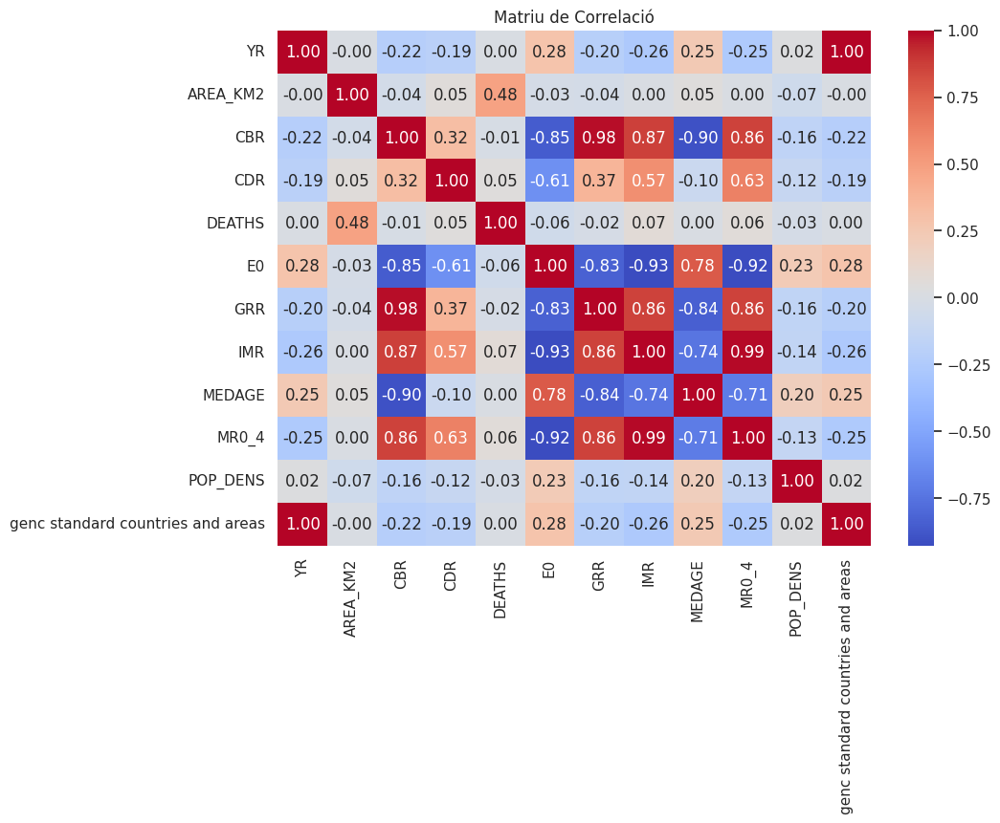

In [ ]:
df_num = df_dem.select_dtypes(include=['float64', 'int64'])
matr_corr = df_num.corr()
plt.figure(figsize=(10, 7))
sns.heatmap(matr_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriu de Correlació')
plt.show()

**Observem que les variables 'YR' i 'genc standard countries and areas' tenen una correlació d'1, i conseqüentment, podem eliminar la variable de 'genc standard countries and areas'. Decidim eliminar aquesta i no 'YR' ja que ja hem unificat els noms de les columnes de les bases de dades anteriorment, i la que hem modificat ha estat la columna dels anys.**


**Hi ha altres relacions interessants, utilitzarem una funció per extreure-les i poder-les valorar totes.**




In [ ]:
# Obtenim les parelles correlacionades
high_corr_pairs = (matr_corr.abs() > 0.85) & (matr_corr.abs() < 1)
high_corr_pairs = high_corr_pairs.unstack().reset_index()
high_corr_pairs = high_corr_pairs[high_corr_pairs[0]]
high_corr_pairs = high_corr_pairs[high_corr_pairs.level_0 < high_corr_pairs.level_1]

# Eliminem les parelles repetides
printed_pairs = set()

# Creem el dataset
data = []
for idx, row in high_corr_pairs.iterrows():
    var1 = row['level_0']
    var2 = row['level_1']
    corr = matr_corr.loc[var1, var2]

    # Verificar si la parella ja s'ha imprès
    if (var2, var1) not in printed_pairs:
        data.append((var1, var2, corr))
        printed_pairs.add((var1, var2))

df_corr_table = pd.DataFrame(data, columns=['Var 1', 'Var 2', 'Correlació'])
df_corr_table

,Var 1,Var 2,Correlació
0,CBR,E0,-0.852502
1,CBR,GRR,0.981564
2,CBR,IMR,0.865625
3,CBR,MEDAGE,-0.899553
4,CBR,MR0_4,0.859922
5,E0,IMR,-0.926783
6,E0,MR0_4,-0.924436
7,GRR,IMR,0.859846
8,GRR,MR0_4,0.862275
9,IMR,MR0_4,0.987801


Observem que algunes relacions són força obvies:
*   Relació directa entre la taxa de natalitat bruta (CBR) i la taxa global de fecunditat (GRR).
*   Relació indirecta entre la taxa de natalitat bruta (CBR) i la mediana d'edat de la població (MEDAGE).
* Relació indirecta entre l'esperança de vida en nèixer (E0) i la mortalitat de nens menors de 5 anys (MR0_4).
* Forta correlació entre IMR i MR0_4, ja prevista, hem eliminat IMR previament.

Altres relacions que ens poden sorprendre i que podem tenir en compte per a fer el nostre model són:
* Relació indirecta entre la taxa de natalitat i l'esperança de vida en nèixer.  
* Relació directa entre el nombre de naixements (CBR) i la mortalitat infantil.
* Relació directa entre la taxa de fecunditat (GRR) i la mortalitat infantil.

A partir d'aquestes relacions no tan obvies podem dir que:

1.   La mortalitat infantil augmenta la taxa de naixements.
2.   El nombre mitjà de fills que tindria una dona si visqués fins al final del seu període reproductiu augmenta la taxa de mortalitat infantil.









#### **Estudi de la base de dades relativa a la salut mental**

In [ ]:
mh.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Schizophrenia (%): double (nullable = true)
 |-- Bipolar disorder (%): double (nullable = true)
 |-- Eating disorders (%): double (nullable = true)
 |-- Anxiety disorders (%): double (nullable = true)
 |-- Drug use disorders (%): double (nullable = true)
 |-- Depression (%): double (nullable = true)
 |-- Alcohol use disorders (%): double (nullable = true)



Malgrat això, realitzarem la matriu de correlacions amb l'objectiu de trobar relacions interessants.

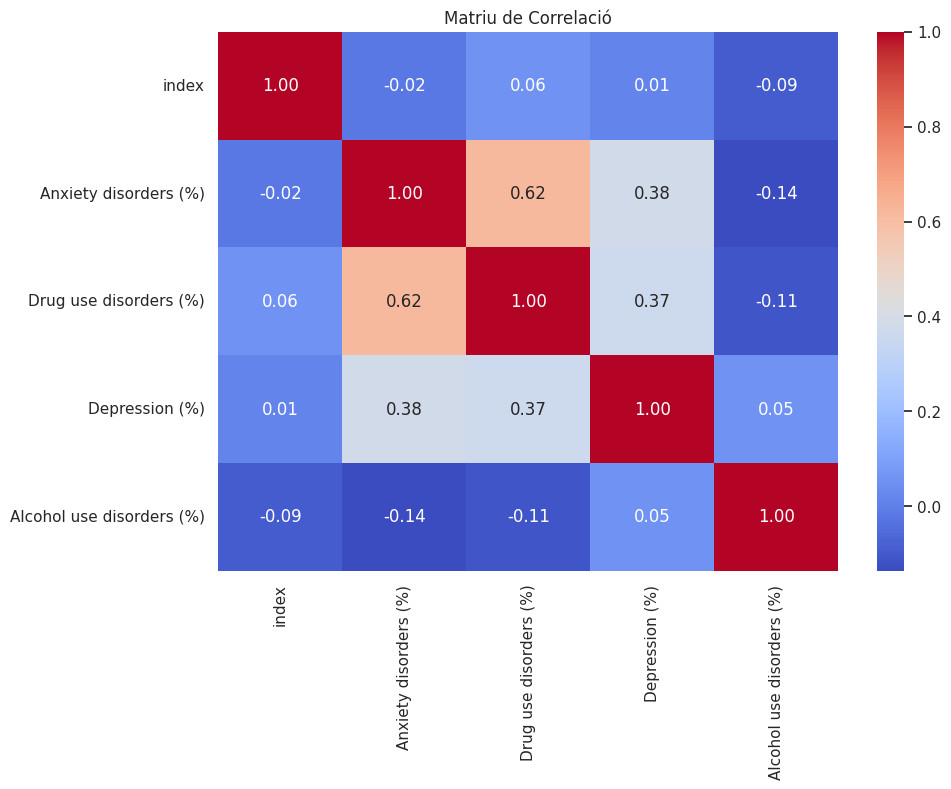

In [ ]:
df_num = df_mh.select_dtypes(include=['float64', 'int64'])
matr_corr = df_num.corr()
plt.figure(figsize=(10, 7))
sns.heatmap(matr_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriu de Correlació')
plt.show()

No trobem relacions significatives segons el nostre *threshold*. Amb la implementació de models de dades conjuntes intentarem cercar quina relació té la salut mental amb altres factors socials i demogràfics.

## Missings

### Filtre de Columnes

In [142]:
def rename_columns(df: DataFrame) -> DataFrame:
    # Itera sobre cada nombre de columna en el DataFrame
    for column_name in df.columns:
        # Reemplaza puntos por guiones bajos en el nombre de la columna
        new_column_name = column_name.replace(".", "")
        # Renombra la columna en el DataFrame
        df = df.withColumnRenamed(column_name, new_column_name)
    return df

# Aplica la función para renombrar las columnas del DataFrame
soc = rename_columns(soc)

# Imprime los nuevos nombres de las columnas para verificar
print(soc.columns)

['Country', 'Year', 'Area (square kilometres)', 'Total population', 'Population density, pers per sq km', 'Total population, male (%)', 'Total population, female (%)', 'Mean age of women at birth of first child', 'Computer use, 16-24, male', 'Computer use, 16-24, female', 'Computer use, 25-54, male', 'Computer use, 25-54, female', 'Computer use, 55-74, male', 'Computer use, 55-74, female', 'Women in the Labour Force, Percent of corresponding total for both sexes', 'Gender pay gap in monthly earnings', 'Female tertiary students, percent of total', 'Women Researchers, Percent of corresponding total for both sexes', 'Female legislators, senior officials and managers, percent of total', 'Female professionals, percent of total for both sexes', 'Female clerks, percent of total for both sexes', 'Female craft and related workers, percent of total for both sexes', 'Female plant and machine operators and assemblers, percent of total for both sexes', 'Female government ministers, percent of total

In [155]:
def atps(df: DataFrame, threshold: float) -> DataFrame:
    total_rows = df.count()

    cols_to_keep = []
    for col_name in df.columns:
        non_null_count = df.filter(col(col_name).isNotNull()).count()
        non_null_percentage = non_null_count / total_rows

        if non_null_percentage > (1 - threshold):
            cols_to_keep.append(col_name)

    filtered_df = df.select(*cols_to_keep)
    return filtered_df

soc = atps(soc, .30)

**KMEANS**

### Demography

In [157]:
# IDENTIFICAR COLUMNES AMB MISSING DATA:

# Calcular el número total de filas
total_rows = dem.count()

# Encontrar las columnas con valores NA
na_columns = []
for column in dem.columns:
    # Contar los valores no nulos en la columna actual
    non_na_count = dem.agg(count(col(column)).alias('non_na_count')).collect()[0]['non_na_count']
    # Si el conteo de no-nulos es menor que el total de filas, la columna tiene NAs
    if non_na_count < total_rows:
        na_columns.append(column)

# Imprimir las columnas con valores NA
print("Columnas con valores NA:", na_columns)


Columnas con valores NA: ['CBR', 'CDR', 'Deaths', 'E0', 'Medage', 'MR0_4']


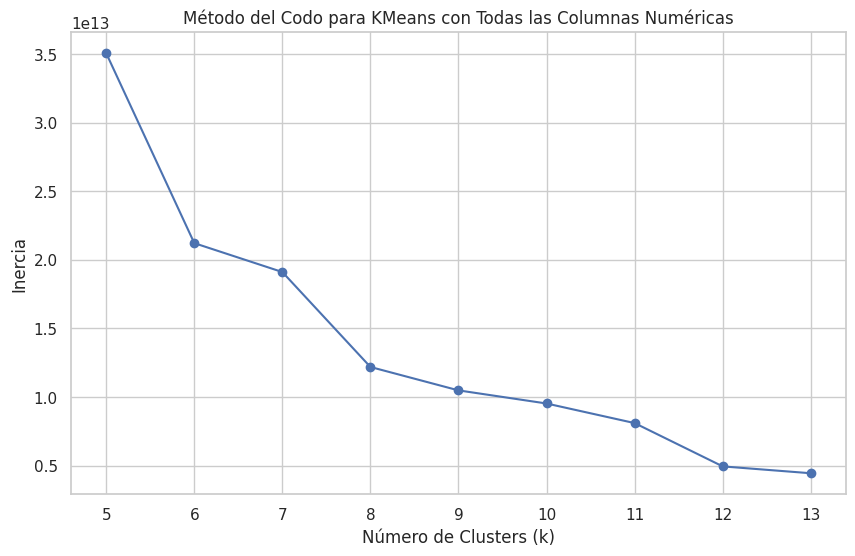

In [158]:
# TRIAR VALOR ÒPTIM DE K

# Identificar columnas numéricas
numeric_cols = [field.name for field in dem.schema.fields if isinstance(field.dataType, (pyspark.sql.types.IntegerType, pyspark.sql.types.DoubleType))]

# Calcular la media para imputar valores faltantes en las columnas numéricas
mean_values = {col: dem.select(mean(col)).first()[0] for col in numeric_cols}

# Imputar los valores faltantes con la media de cada columna
dem_filled = dem.na.fill(mean_values)

# Configurar VectorAssembler con las columnas numéricas imputadas
vecAssembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
dem_features = vecAssembler.transform(dem_filled)

# Rango de valores de k para evaluar
k_values = range(5, 14)

# Lista para almacenar los resultados de inercia para cada k
inertias = []

for k in k_values:
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(dem_features)

    # Calcular la inercia y agregarla a la lista
    inertia = model.summary.trainingCost
    inertias.append(inertia)

# Convertir los resultados a un DataFrame de pandas para facilitar la visualización
df_results = pd.DataFrame({'K': k_values, 'Inertia': inertias})

# Graficar
plt.figure(figsize=(10, 6))
plt.plot(df_results['K'], df_results['Inertia'], marker='o')
plt.title('Método del Codo para KMeans con Todas las Columnas Numéricas')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inercia')
plt.xticks(k_values)
plt.grid(True)
plt.show()


In [162]:
#IMPUTAR AMB VALOR DE K TROBAT (9)
impute_cols = ['CBR', 'CDR', 'Deaths', 'E0', 'Medage', 'MR0_4']

# Marcar los valores faltantes antes de la imputación temporal
for col_name in impute_cols:
    dem = dem.withColumn(f"{col_name}_was_na", col(col_name).isNull())

# Imputación temporal de valores faltantes para la ejecución de KMeans
for col_name in impute_cols:
    mean_value = dem.select(mean(col(col_name)).alias(col_name)).collect()[0][col_name]
    dem = dem.na.fill(mean_value, subset=[col_name])

# Configuración de KMeans
vecAssembler = VectorAssembler(inputCols=impute_cols, outputCol="features")
kmeans = KMeans().setK(9).setSeed(1).setFeaturesCol("features")
pipeline = Pipeline(stages=[vecAssembler, kmeans])

# Entrenamiento del modelo y asignación de clusters
model = pipeline.fit(dem)
clusters = model.transform(dem)

# Imputación basada en los clusters
# Calcula la media de cada columna para cada cluster
windowSpec  = Window.partitionBy("prediction")
for col_name in impute_cols:
    clusters = clusters.withColumn(f"{col_name}_cluster_mean", mean(col(col_name)).over(windowSpec))

# Aplica la imputación solo donde era NA
for col_name in impute_cols:
    clusters = clusters.withColumn(col_name, when(col(f"{col_name}_was_na"), col(f"{col_name}_cluster_mean")).otherwise(col(col_name)))

# Eliminar columnas auxiliares
columns_to_drop = ["features", "prediction"] + [f"{col}_cluster_mean" for col in impute_cols] + [f"{col}_was_na" for col in impute_cols]
dem = clusters.drop(*columns_to_drop)

---

## Imputació missing data - Society

Seguirem el mateix procediment que amb el dataset _demography.db_.

In [ ]:
soc_pd = soc.toPandas()

In [165]:
# IDENTIFICAR COLUMNES AMB MISSING DATA:

# Calcular el número total de filas
total_rows = soc.count()

# Encontrar las columnas con valores NA
na_columns = []
for column in soc.columns:
    # Contar los valores no nulos en la columna actual
    non_na_count = soc.agg(count(col(column)).alias('non_na_count')).collect()[0]['non_na_count']
    # Si el conteo de no-nulos es menor que el total de filas, la columna tiene NAs
    if non_na_count < total_rows:
        na_columns.append(column)

# Imprimir las columnas con valores NA
print("Columnas con valores NA:", na_columns)


Columnas con valores NA: ['Area (square kilometres)', 'Total population', 'Population density, pers per sq km', 'Total population, male (%)', 'Total population, female (%)', 'Mean age of women at birth of first child', 'Women in the Labour Force, Percent of corresponding total for both sexes', 'Female tertiary students, percent of total', 'Female legislators, senior officials and managers, percent of total', 'Female professionals, percent of total for both sexes', 'Female clerks, percent of total for both sexes', 'Female craft and related workers, percent of total for both sexes', 'Female plant and machine operators and assemblers, percent of total for both sexes', 'Female members of parliament, percent of total', 'Total employment, growth rate', 'Unemployment rate', 'Youth unemployment rate', 'GDP at current prices and PPPs, millions of US$', 'GDP per capita at current prices and PPPs, US$', 'Final consumption expenditure per capita, US Dollars, current PPPs', 'Purchasing power parity

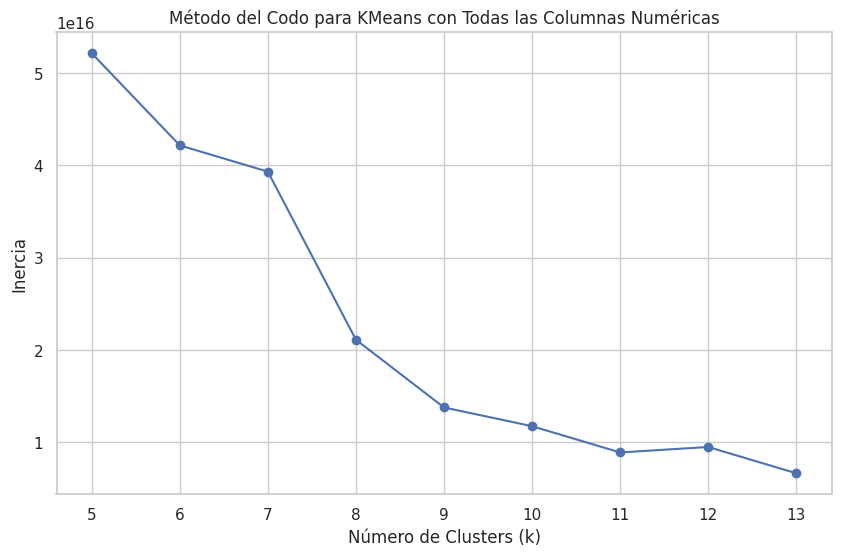

In [166]:
# TRIAR VALOR ÒPTIM DE K

# Identificar columnas numéricas
numeric_cols = [field.name for field in soc.schema.fields if isinstance(field.dataType, (pyspark.sql.types.IntegerType, pyspark.sql.types.DoubleType))]

# Calcular la media para imputar valores faltantes en las columnas numéricas
mean_values = {col: soc.select(mean(col)).first()[0] for col in numeric_cols}
# Imputar los valores faltantes con la media de cada columna
soc_filled = soc.na.fill(mean_values)

# Configurar VectorAssembler con las columnas numéricas imputadas
vecAssembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
soc_features = vecAssembler.transform(soc_filled)

# Rango de valores de k para evaluar
k_values = range(5, 14)

# Lista para almacenar los resultados de inercia para cada k
inertias = []

for k in k_values:
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(soc_features)

    # Calcular la inercia y agregarla a la lista
    inertia = model.summary.trainingCost
    inertias.append(inertia)

# Convertir los resultados a un DataFrame de pandas para facilitar la visualización
df_results = pd.DataFrame({'K': k_values, 'Inertia': inertias})

# Graficar
plt.figure(figsize=(10, 6))
plt.plot(df_results['K'], df_results['Inertia'], marker='o')
plt.title('Método del Codo para KMeans con Todas las Columnas Numéricas')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inercia')
plt.xticks(k_values)
plt.grid(True)
plt.show()


In [167]:
#IMPUTAR AMB VALOR DE K TROBAT (10)

impute_cols = numeric_cols.copy()

# Marcar los valores faltantes antes de la imputación temporal
for col_name in impute_cols:
    soc = soc.withColumn(f"{col_name}_was_na", col(col_name).isNull())

# Imputación temporal de valores faltantes para la ejecución de KMeans
for col_name in impute_cols:
    mean_value = soc.select(mean(col(col_name)).alias(col_name)).collect()[0][col_name]
    soc = soc.na.fill(mean_value, subset=[col_name])

# Configuración de KMeans
vecAssembler = VectorAssembler(inputCols=impute_cols, outputCol="features")
kmeans = KMeans().setK(10).setSeed(1).setFeaturesCol("features")
pipeline = Pipeline(stages=[vecAssembler, kmeans])

# Entrenamiento del modelo y asignación de clusters
model = pipeline.fit(soc)
clusters = model.transform(soc)

# Imputación basada en los clusters
# Calcula la media de cada columna para cada cluster
windowSpec = Window.partitionBy("prediction")
for col_name in impute_cols:
    clusters = clusters.withColumn(f"{col_name}_cluster_mean", mean(col(col_name)).over(windowSpec))

# Aplica la imputación solo donde era NA
for col_name in impute_cols:
    clusters = clusters.withColumn(col_name, when(col(f"{col_name}_was_na"), col(f"{col_name}_cluster_mean")).otherwise(col(col_name)))

# Eliminar columnas auxiliares
columns_to_drop = ["features", "prediction"] + [f"{col}_cluster_mean" for col in impute_cols] + [f"{col}_was_na" for col in impute_cols]
soc = clusters.drop(*columns_to_drop)



In [169]:
soc_pd = soc.toPandas()

---

## Imputació missing data - Mental Health

In [ ]:
percentage_columns = [
    'Schizophrenia (%)', 'Bipolar disorder (%)', 'Eating disorders (%)',
    'Anxiety disorders (%)', 'Drug use disorders (%)', 'Depression (%)',
    'Alcohol use disorders (%)'
]

for column in percentage_columns:
    mh = mh.withColumn(column, when((col(column) >= 0) & (col(column) <= 100), col(column)).otherwise(None))


['Schizophrenia (%)', 'Bipolar disorder (%)', 'Eating disorders (%)', 'Anxiety disorders (%)', 'Drug use disorders (%)', 'Depression (%)', 'Alcohol use disorders (%)']
{'Schizophrenia (%)': 4.863448835243184, 'Bipolar disorder (%)': 2.4291004770817266, 'Eating disorders (%)': 0.2475385166793991, 'Anxiety disorders (%)': 4.000661920040745, 'Drug use disorders (%)': 0.8782349348102884, 'Depression (%)': 3.487061533740776, 'Alcohol use disorders (%)': 1.5953316251591518}
DataFrame[Country: string, Year: string, Schizophrenia (%): double, Bipolar disorder (%): double, Eating disorders (%): double, Anxiety disorders (%): double, Drug use disorders (%): double, Depression (%): double, Alcohol use disorders (%): double]
DataFrame[Country: string, Year: string, Schizophrenia (%): double, Bipolar disorder (%): double, Eating disorders (%): double, Anxiety disorders (%): double, Drug use disorders (%): double, Depression (%): double, Alcohol use disorders (%): double, features: vector]


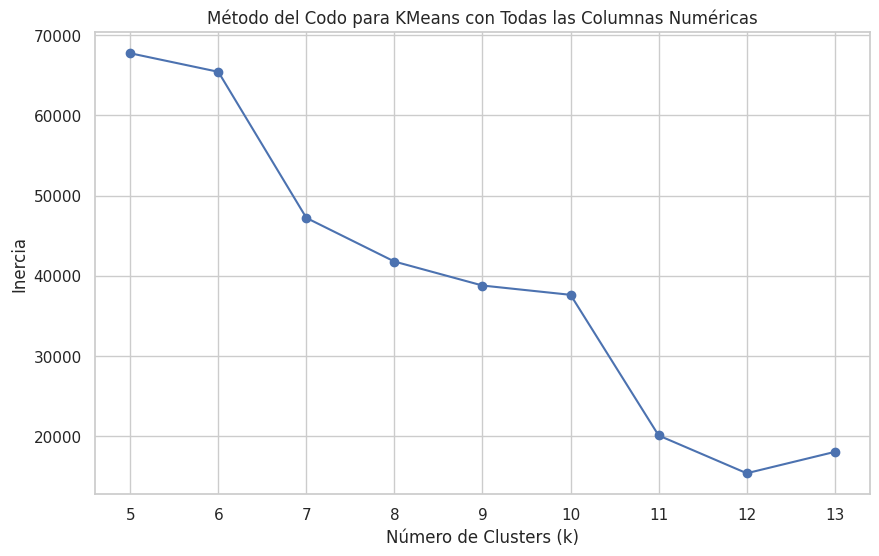

In [171]:
# TRIAR VALOR ÒPTIM DE K

numeric_cols = [field.name for field in mh.schema.fields if isinstance(field.dataType, (pyspark.sql.types.IntegerType, pyspark.sql.types.DoubleType))]
print(numeric_cols)

mean_values = {col: mh.select(mean(col)).first()[0] for col in numeric_cols}
print(mean_values)
mh_filled = mh.na.fill(mean_values)
print(mh_filled)

vecAssembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
mh_features = vecAssembler.transform(mh_filled)
print(mh_features)

k_values = range(5, 14)
inertias = []

for k in k_values:
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(mh_features)
    inertia = model.summary.trainingCost
    inertias.append(inertia)

df_results = pd.DataFrame({'K': k_values, 'Inertia': inertias})

plt.figure(figsize=(10, 6))
plt.plot(df_results['K'], df_results['Inertia'], marker='o')
plt.title('Método del Codo para KMeans con Todas las Columnas Numéricas')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inercia')
plt.xticks(k_values)
plt.grid(True)
plt.show()


In [172]:
#IMPUTAR AMB VALOR DE K TROBAT (11)

impute_cols = numeric_cols.copy()
for col_name in impute_cols:
    mh = mh.withColumn(f"{col_name}_was_na", col(col_name).isNull())
for col_name in impute_cols:
    mean_value = mh.select(mean(col(col_name)).alias(col_name)).collect()[0][col_name]
    mh = mh.na.fill(mean_value, subset=[col_name])

vecAssembler = VectorAssembler(inputCols=impute_cols, outputCol="features")
kmeans = KMeans().setK(8).setSeed(1).setFeaturesCol("features")
pipeline = Pipeline(stages=[vecAssembler, kmeans])

model = pipeline.fit(mh)
clusters = model.transform(mh)

windowSpec = Window.partitionBy("prediction")
for col_name in impute_cols:
    clusters = clusters.withColumn(f"{col_name}_cluster_mean", mean(col(col_name)).over(windowSpec))
for col_name in impute_cols:
    clusters = clusters.withColumn(col_name, when(col(f"{col_name}_was_na"), col(f"{col_name}_cluster_mean")).otherwise(col(col_name)))

columns_to_drop = ["features", "prediction"] + [f"{col}_cluster_mean" for col in impute_cols] + [f"{col}_was_na" for col in impute_cols]
mh = clusters.drop(*columns_to_drop)

### Esborrar columnes redundants entre datasets

In [177]:
soc = soc.drop('Area (square kilometres)','Population density, pers per sq km')

### Guardar els resultats

In [178]:
dem.write \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:trusted_zone.db") \
    .option("dbtable", "dem") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .save()

soc.write \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:trusted_zone.db") \
    .option("dbtable", "soc") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .save()

mh.write \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:trusted_zone.db") \
    .option("dbtable", "mh") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .save()

In [179]:
spark = SparkSession.builder \
    .appName("Preprocessing") \
    .config("spark.jars", "/content/betterlifebetterhealth/src/duckdb.jar") \
    .getOrCreate()

dem = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/trusted_zone.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "dem") \
    .load()

mh = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/trusted_zone.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "mh") \
    .load()

soc = spark.read \
    .format("jdbc") \
    .option("url", "jdbc:duckdb:/content/trusted_zone.db") \
    .option("driver", "org.duckdb.DuckDBDriver") \
    .option("dbtable", "soc") \
    .load()